In [1]:
import pandas as pd
import numpy as np
from sentence_transformers import SentenceTransformer, util
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from nltk.tokenize import sent_tokenize
from nltk.stem import WordNetLemmatizer
import nltk
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNet
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import RandomizedSearchCV
import torch
import torch_optimizer as opt
import string
import matplotlib.pyplot as plt

/home/henry/.local/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
torch.cuda.get_arch_list()

['sm_37', 'sm_50', 'sm_60', 'sm_70', 'sm_75', 'sm_80', 'sm_86']

In [2]:
train_data = pd.read_csv("/home/henry/work/projects/nlp_data/train.csv")
ref_data = pd.read_csv("/home/henry/work/projects/nlp_data/test.csv")

In [3]:

train1, train2 = train_test_split(train_data, train_size=.7)
test_sample, train2 = train_test_split(train2, train_size=0.2)

In [4]:
comp_vecs = {}
lem = WordNetLemmatizer()
model = SentenceTransformer('all-mpnet-base-v2', device="cuda")
for col in test_sample.columns[3:]:
    print(col)
    text = test_sample[test_sample[col] == 1]["ABSTRACT"].values.flatten().tolist()
    to_enc = []
    for t in text:
        t = "".join([v.lower() for v in t if v not in string.punctuation])
        to_enc.append(lem.lemmatize(t))
    text = model.encode(to_enc, batch_size=32, show_progress_bar=True).mean(axis=0)
    comp_vecs[col] = text


Computer Science


Batches: 100%|██████████| 17/17 [00:07<00:00,  2.30it/s]


Physics


Batches: 100%|██████████| 12/12 [00:04<00:00,  2.59it/s]


Mathematics


Batches: 100%|██████████| 11/11 [00:03<00:00,  3.23it/s]


Statistics


Batches: 100%|██████████| 10/10 [00:03<00:00,  2.52it/s]


Quantitative Biology


Batches: 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]


Quantitative Finance


Batches: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


In [182]:
def get_cos_sim(df):
    cos_sim_arr = []
    max_corr = []
    cnt = 0
    model = SentenceTransformer('all-mpnet-base-v2', device="cuda")
    for idx, row in df.iterrows():
        s = sent_tokenize(row["ABSTRACT"])
        lem_txt = []
        for i in s:
            i = "".join([v.lower() for v in i if v not in string.punctuation])
            lem_txt.append(lem.lemmatize(i))
        vec = model.encode(lem_txt, batch_size=32)
        num_vec = len(vec)
        cos_sim = []
        to_max_count = []
        for key in comp_vecs.keys():
            print(key)
            cos_vals = util.cos_sim(comp_vecs[key], vec)
            print(cos_vals[0])
            cos_sim.append(util.cos_sim(vec.mean(axis=0) ,comp_vecs[key]).item())
            to_max_count.append(cos_vals.tolist())
        to_max_count = np.array(to_max_count).reshape(num_vec, 6)
        max_counts = np.array([0,0,0,0,0,0])
        for v in to_max_count:
            max_counts[v.argmax()] += 1
        max_corr.append(max_counts/num_vec)
        
        print(cos_sim)
        cos_sim_arr.append(cos_sim)
        print("{}/{}".format(cnt, len(df)))
        cnt += 1
    
    return np.hstack((np.array(cos_sim_arr), np.array(max_corr)))

In [111]:
def get_raw_vec(df):
    raw_vec_arr = []
    lem = WordNetLemmatizer()
    model = SentenceTransformer('all-mpnet-base-v2', device="cuda")
    cnt = 0
    for idx, row in df.iterrows():
        s = sent_tokenize(row["ABSTRACT"])
        lem_txt = ""
        for i in s:
            lem_txt += lem.lemmatize(i)
        lem_txt = "".join([v.lower() for v in lem_txt if v not in string.punctuation])
        cnt += 1
        raw_vec_arr.append(lem_txt)
    return model.encode(raw_vec_arr, batch_size=32, show_progress_bar=True)


In [112]:

train_y_data = train1[train1.columns[3:]].values
raw_df = get_raw_vec(train1)

Batches: 100%|██████████| 459/459 [03:11<00:00,  2.40it/s]


In [183]:
x_cos_train = get_cos_sim(train1)
x_cos_test = get_cos_sim(train2)

Computer Science
tensor([0.4060, 0.3374, 0.3580, 0.2997, 0.4218, 0.3074])
Physics
tensor([ 0.0304,  0.0441,  0.1006, -0.0011,  0.0248,  0.0526])
Mathematics
tensor([0.3457, 0.3863, 0.3796, 0.4126, 0.4854, 0.3982])
Statistics
tensor([0.3959, 0.3395, 0.4211, 0.2365, 0.4391, 0.1802])
Quantitative Biology
tensor([0.2108, 0.1797, 0.2872, 0.1389, 0.2272, 0.1731])
Quantitative Finance
tensor([0.1406, 0.1312, 0.0854, 0.2198, 0.2999, 0.2113])
[0.4640473425388336, 0.05479995533823967, 0.5244874954223633, 0.4383513033390045, 0.2650614380836487, 0.23703400790691376]
0/14680
Computer Science
tensor([0.4575, 0.2029, 0.2967, 0.3126, 0.3876, 0.3552, 0.3446, 0.4189, 0.2746,
        0.4769, 0.3205, 0.1528, 0.2150])
Physics
tensor([0.2458, 0.1301, 0.0541, 0.0015, 0.0693, 0.1037, 0.0923, 0.0987, 0.1146,
        0.1340, 0.1202, 0.1084, 0.2000])
Mathematics
tensor([0.1090, 0.0759, 0.0566, 0.0618, 0.1871, 0.1214, 0.2469, 0.1431, 0.0852,
        0.1107, 0.1063, 0.0468, 0.1342])
Statistics
tensor([0.4110, 0.07

In [114]:
test_raw = get_raw_vec(train2)
test_y = train2[train2.columns[3:]].values

Batches: 100%|██████████| 158/158 [01:05<00:00,  2.43it/s]


In [175]:
dif_squared_sum_train = x_cos_train
dif_squared_sum_test = x_cos_test

In [188]:
scaler = StandardScaler()
scaler.fit(dif_squared_sum_train)
dif_squared_sum_train = scaler.transform(dif_squared_sum_train)
scaler.fit(dif_squared_sum_test)
dif_squared_sum_test = scaler.transform(dif_squared_sum_test)

In [189]:
scaler = StandardScaler()
scaler.fit(dif_abs_sum_train)
dif_abs_sum_train = scaler.transform(dif_abs_sum_train)
scaler.fit(dif_abs_sum_test)
dif_abs_sum_test = scaler.transform(dif_abs_sum_test)

In [181]:
dif_abs_sum_train = x_cos_train
dif_abs_sum_test = x_cos_test

In [187]:
cos_sim_train = x_cos_train
cos_sim_test = x_cos_test

In [185]:
train_dat = []
for r in range(len(train_y_data)):
    if train_y_data[r].tolist().count(1) > 1:
        train_dat.append(False)
    else:
        train_dat.append(True)
x_cos_train = x_cos_train[np.array(train_dat)]
#raw_df = raw_df[np.array(train_dat)]
train_y_data = train_y_data[np.array(train_dat)]
train_dat = []
for r in range(len(test_y)):
    if test_y[r].tolist().count(1) > 1:
        train_dat.append(False)
    else:
        train_dat.append(True)
x_cos_test = x_cos_test[np.array(train_dat)]
#test_raw = test_raw[np.array(train_dat)]
test_y = test_y[np.array(train_dat)]


In [184]:
test_y = train2[train2.columns[3:]].values
train_y_data = train1[train1.columns[3:]].values

In [186]:
scaler = StandardScaler()
scaler.fit(raw_df)
raw_df = scaler.transform(raw_df)
scaler.fit(x_cos_train)
x_cos_train = scaler.transform(x_cos_train)
scaler.fit(x_cos_test)
x_cos_test = scaler.transform(x_cos_test)
scaler.fit(test_raw)
test_raw = scaler.transform(test_raw)


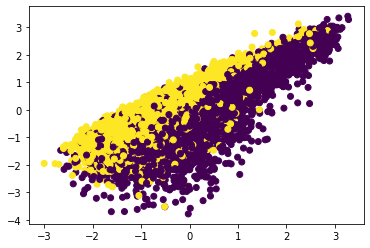

In [91]:
plt.scatter(abs_sum_x[:,1], abs_sum_x[:,5], c=train_y_data[:,1])

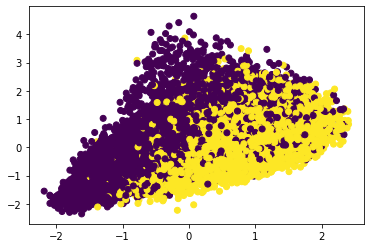

In [92]:
plt.scatter(x_cos_train[:,1], x_cos_train[:,5], c=train_y_data[:,1])

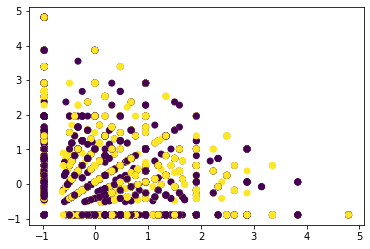

In [99]:
plt.scatter(square_sum_x[:,6], square_sum_x[:,9], c=train_y_data[:,0])

In [143]:
from torch import dropout


class Model_first(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.l1 = Parameter(torch.randn((128, 768), requires_grad=True, device="cuda"))
        self.l2 = Parameter(torch.randn((128,128), requires_grad=True, device="cuda"))
        self.l3 = Parameter(torch.randn((6,128), requires_grad=True, device="cuda"))
        
        #self.first_soft_loss = 0
        #self.loss_f = torch.nn.CrossEntropyLoss(reduction="mean")
        #self.y_data = None
    def forward(self, x):
        #init_x = x
        #dropout = torch.nn.Dropout(p=0.2)
        x = func.linear(x, self.l1).cuda()
        x = func.silu(x).cuda()
        skip1 = x
        x = func.linear(x, self.l2).cuda()
        x = func.silu(x).cuda()
        x = x + skip1
        x = func.linear(x, self.l3).cuda()
        return func.softmax(x).cuda()
    def parameters(self):
        return [self.l1,self.l2,self.l3]

In [211]:
from torch.nn import Parameter
import torch.nn.functional as func
class Model_soft(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.prelim_model = Model_first()
        self.h4 = Parameter(torch.randn((64,24), requires_grad=True, device="cuda"))
        self.h5 = Parameter(torch.randn((64,64), requires_grad=True, device="cuda"))
        self.h6 = Parameter(torch.randn((64,64), requires_grad=True, device="cuda"))
        self.h7 = Parameter(torch.randn((32,64), requires_grad=True, device="cuda"))
        self.h8 = Parameter(torch.randn((6,32), requires_grad=True, device="cuda"))
        self.first_soft_loss = 0
        self.loss_f = torch.nn.CrossEntropyLoss(reduction="mean")
        self.y_data = None
    def forward(self, x):
        dropout = torch.nn.Dropout(p=0.2)
        cos_data = x[:,-18:]
        x = self.prelim_model(x[:,:-18])
        self.first_soft_loss = self.loss_f(x, self.y_data)
        x = torch.hstack((x,cos_data))
        x = func.linear(x, self.h4).cuda()
        x = func.silu(x).cuda()
        #x = dropout(x)
        skip1 = x
        x = func.linear(x, self.h5).cuda()
        x = func.silu(x).cuda()
        x = x + skip1
        #x = dropout(x)
        skip2 = x
        x = func.linear(x, self.h6).cuda()
        x = func.silu(x).cuda()
        x = x + skip2
        x = func.linear(x, self.h7).cuda()
        x = func.silu(x).cuda()
        x = func.linear(x, self.h8).cuda()
        return func.softmax(x, dim=1)
    def parameters(self):
        return [self.prelim_model.l1,self.prelim_model.l2,self.prelim_model.l3, self.h4, self.h5, self.h6, self.h7, self.h8]
    def with_cos_pred(self, x):
        x = func.linear(x, self.h4).cuda()
        x = func.silu(x).cuda()
        skip1 = x
        x = func.linear(x, self.h5).cuda()
        x = func.silu(x).cuda()
        x = x + skip1
        skip2 = x
        x = func.linear(x, self.h6).cuda()
        x = func.silu(x).cuda()
        x = x + skip2
        x = func.linear(x, self.h7).cuda()
        x = func.silu(x).cuda()
        x = func.linear(x, self.h8).cuda()
        return func.softmax(x, dim=1)
    def predict(self, x_data):
        first_pred = self.prelim_model(x_data[:,:-18])
        return self.with_cos_pred(torch.hstack((first_pred, x_data[:,-18:])))

In [47]:
class Model_cos(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.h1 = Parameter(torch.randn((64, 12), requires_grad=True, device="cuda"))
        self.h2 = Parameter(torch.randn((64,64), requires_grad=True, device="cuda"))
        self.h3 = Parameter(torch.randn((64,64), requires_grad=True, device="cuda"))
        self.h4 = Parameter(torch.randn((64,64), requires_grad=True, device="cuda"))
        self.h5 = Parameter(torch.randn((6,64), requires_grad=True, device="cuda"))
    def forward(self, x):
        x = func.linear(x, self.h1).cuda()
        x = func.silu(x).cuda()
        skip1 = x
        x = func.linear(x, self.h2).cuda()
        x = func.silu(x).cuda()
        x = x + skip1
        skip2 = x
        x = func.linear(x, self.h3).cuda()
        x = func.silu(x).cuda()
        x = x + skip2
        skip3 = x
        x = func.linear(x, self.h4).cuda()
        x = func.silu(x).cuda()
        x = x + skip3
        x = func.linear(x, self.h5).cuda()
        return func.softmax(x, dim=1)
    def parameters(self):
        return [self.h1,self.h2,self.h3,self.h4, self.h5]

In [ ]:
"""
differentiate between similar disclosure types, econ commentary advisor vs not

"""

In [257]:
from torch.nn import Linear as lin
import queue
import random

x_all_train = np.hstack((raw_df,cos_sim_train, dif_squared_sum_train[:,:6], train_y_data))
test_x = np.hstack((test_raw, cos_sim_test, dif_squared_sum_test[:,:6]))
#model = torch.nn.Sequential(lin(384,128*2), torch.nn.SiLU(), lin(128*2,128*2), torch.nn.SiLU(), lin(128*2,128*2), torch.nn.SiLU(), lin(128*2,128*2), torch.nn.SiLU(), lin(128*2,128*2), torch.nn.SiLU(), lin(128*2,64), torch.nn.SiLU(), lin(64,32), torch.nn.SiLU(), lin(32,6), torch.nn.Softmax()).cuda()
model = Model_soft()
loss_fn = torch.nn.CrossEntropyLoss(reduction="mean")
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
current_min = 999999999
num_since = 0
best_params = model.parameters()
for t in range(200000):
    x_full, _ = train_test_split(x_all_train, train_size=0.01)
    x_train = torch.from_numpy(x_full[:,:-6]).float().cuda()
    y_train = torch.from_numpy(x_full[:,-6:]).float().cuda()
    model.y_data = y_train
    y_pred = model(x_train)
    loss = loss_fn(y_pred, y_train)
    for i in model.parameters():
        loss += (torch.square(i).sum())*0.0025
    loss += model.first_soft_loss*0.01
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step(lambda: loss)
    if t%100 == 0:
        print(model.first_soft_loss)
        print(t, loss)
    if loss.item() < current_min:
        num_since = 0
        current_min = loss
        best_params = model.parameters()
    elif num_since >= 300:
        print("max iter")
        break
    else:
        num_since += 1
    
    """
    if t%500 == 0:
        print(get_score(model(torch.from_numpy(x_all_train[:,:-6]).float().cuda()), torch.from_numpy(train_y_data).float().cuda()) -  get_score(model(torch.from_numpy(test_x).float().cuda()), torch.from_numpy(test_y).float().cuda()))
        if get_score(model(torch.from_numpy(x_all_train[:,:-6]).float().cuda()), torch.from_numpy(train_y_data).float().cuda()) -  get_score(model(torch.from_numpy(test_x).float().cuda()), torch.from_numpy(test_y).float().cuda()) > 0.1:
            print("early stop")
            break
    """
model.prelim_model.l1 = best_params[0]
model.prelim_model.l2 = best_params[1]
model.prelim_model.l3 = best_params[2]
model.h4 = best_params[3]
model.h5 = best_params[4]
model.h6 = best_params[5]
model.h7 = best_params[6]
model.h8 = best_params[7]

/tmp/ipykernel_3206/3417508929.py:24: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return func.softmax(x).cuda()


tensor(1.8724, device='cuda:0', grad_fn=<DivBackward1>)
0 tensor(318.3297, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.9265, device='cuda:0', grad_fn=<DivBackward1>)
100 tensor(273.9032, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.8544, device='cuda:0', grad_fn=<DivBackward1>)
200 tensor(236.5987, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.7555, device='cuda:0', grad_fn=<DivBackward1>)
300 tensor(205.0555, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.7588, device='cuda:0', grad_fn=<DivBackward1>)
400 tensor(177.8970, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.7438, device='cuda:0', grad_fn=<DivBackward1>)
500 tensor(154.7051, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.7815, device='cuda:0', grad_fn=<DivBackward1>)
600 tensor(134.8007, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.7640, device='cuda:0', grad_fn=<DivBackward1>)
700 tensor(117.6029, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1.7255, device='cuda:0', grad_fn=<DivBackward1>)
80

In [261]:
z = []
for i in model.predict(torch.from_numpy(test_x).float().cuda()).detach().cpu().numpy():
    z.append(i.argmax())
model_out = np.array(z)

/tmp/ipykernel_3206/3417508929.py:24: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return func.softmax(x).cuda()


In [262]:
true = []
for i in test_y:
    true.append(i.argmax())
true = np.array(true)

In [197]:
print(get_score(model.predict(torch.from_numpy(x_all_train[:,:-6]).float().cuda()), torch.from_numpy(train_y_data).float().cuda()))
print(get_score(model.predict(torch.from_numpy(test_x).float().cuda()), torch.from_numpy(test_y).float().cuda()))
print(confusion_matrix(true,model_out))

/tmp/ipykernel_3206/3417508929.py:24: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return func.softmax(x).cuda()


0.9164799713235953
0.8538057742782152
[[1096   18   39   62    0    0]
 [  41 1110   24   12    0    0]
 [  43   25  773   10    0    0]
 [ 113   13    4  274    0    0]
 [  22   53    8   21    0    0]
 [  13    1   13   22    0    0]]


In [201]:
print(get_score(model.predict(torch.from_numpy(x_all_train[:,:-6]).float().cuda()), torch.from_numpy(train_y_data).float().cuda()))
print(get_score(model.predict(torch.from_numpy(test_x).float().cuda()), torch.from_numpy(test_y).float().cuda()))
print(confusion_matrix(true,model_out))

/tmp/ipykernel_3206/3417508929.py:24: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return func.softmax(x).cuda()


0.90330674791648
0.84750656167979
[[1067   31   42   75    0    0]
 [  35 1104   33   15    0    0]
 [  53   22  767    9    0    0]
 [ 100   10    3  291    0    0]
 [  22   43    8   31    0    0]
 [  11    1   13   24    0    0]]


In [205]:
print(get_score(model.predict(torch.from_numpy(x_all_train[:,:-6]).float().cuda()), torch.from_numpy(train_y_data).float().cuda()))
print(get_score(model.predict(torch.from_numpy(test_x).float().cuda()), torch.from_numpy(test_y).float().cuda()))
print(confusion_matrix(true,model_out))

/tmp/ipykernel_3206/3417508929.py:24: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return func.softmax(x).cuda()


0.9116408280311856
0.8561679790026246
[[1067   23   31   90    0    4]
 [  24 1129   18   15    0    1]
 [  42   46  748    9    0    6]
 [  97   13    4  285    0    5]
 [  20   46    4   30    0    4]
 [   7    1    3    5    0   33]]


In [263]:
print(get_score(model.predict(torch.from_numpy(x_all_train[:,:-6]).float().cuda()), torch.from_numpy(train_y_data).float().cuda()))
print(get_score(model.predict(torch.from_numpy(test_x).float().cuda()), torch.from_numpy(test_y).float().cuda()))
print(confusion_matrix(true,model_out))

/tmp/ipykernel_3206/3417508929.py:24: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return func.softmax(x).cuda()


0.8928219374495923
0.8459317585301838
[[1084   22   32   77    0    0]
 [  30 1119   27   11    0    0]
 [  54   34  749   14    0    0]
 [ 104   25    4  271    0    0]
 [  21   56    6   21    0    0]
 [  17    1   12   19    0    0]]


In [74]:

#model_cos = torch.nn.Sequential(lin(384,128*2), torch.nn.SiLU(), lin(128*2,128*2), torch.nn.SiLU(), lin(128*2,128*2), torch.nn.SiLU(), lin(128*2,128*2), torch.nn.SiLU(), lin(128*2,128*2), torch.nn.SiLU(), lin(128*2,64), torch.nn.SiLU(), lin(64,32), torch.nn.SiLU(), lin(32,6), torch.nn.Softmax()).cuda()

#init = model(torch.from_numpy(raw_df).float().cuda()).detach().cpu().numpy()
#s = StandardScaler()
#s.fit(init)
#init = s.transform(init)
x_all_train = np.hstack((x_cos_train, train_y_data))
model_cos = Model_cos()
loss_fn = torch.nn.CrossEntropyLoss(reduction="mean")
optimizer = torch.optim.Adam(model_cos.parameters(), lr=0.01)
current_min = 999999999
num_since = 0
best_params = model_cos.parameters()
first = True
second = True
for t in range(200000):
    x_full, _ = train_test_split(x_all_train, train_size=0.1)
    x_train = torch.from_numpy(x_full[:,:-6]).float().cuda()
    y_train = torch.from_numpy(x_full[:,-6:]).float().cuda()
    y_pred = model_cos(x_train)
    loss = loss_fn(y_pred, y_train)
    
    for i in model_cos.parameters():
        loss += (i.abs().sum())*.0001
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step(lambda: loss)
    if t%500 == 0:
        print(t, loss)
    if loss.item() < current_min:
        num_since = 0
        current_min = loss
        best_params = model_cos.parameters()
    elif num_since >= 800:
        print("max iter")
        break
    else:
        num_since += 1
    
    """
    if t%500 == 0:
        print(get_score(model_cos(x_train), y_train) - get_score(model_cos(torch.from_numpy(test_raw).cuda()), test_y))
        if get_score(model_cos(x_train), y_train) - get_score(model_cos(torch.from_numpy(test_raw).cuda()), test_y) > 0.1:
            print("early stop")
            break
    """
model_cos.h1 = best_params[0]
model_cos.h2 = best_params[1]
model_cos.h3 = best_params[2]
model_cos.h4 = best_params[3]
model_cos.h5 = best_params[4]

0 tensor(2.9573, device='cuda:0', grad_fn=<AddBackward0>)
500 tensor(1.9697, device='cuda:0', grad_fn=<AddBackward0>)
1000 tensor(1.7746, device='cuda:0', grad_fn=<AddBackward0>)
1500 tensor(1.4768, device='cuda:0', grad_fn=<AddBackward0>)
2000 tensor(1.3152, device='cuda:0', grad_fn=<AddBackward0>)
2500 tensor(1.2897, device='cuda:0', grad_fn=<AddBackward0>)
3000 tensor(1.2960, device='cuda:0', grad_fn=<AddBackward0>)
3500 tensor(1.2818, device='cuda:0', grad_fn=<AddBackward0>)
max iter


In [75]:
print(get_score(model_cos(torch.from_numpy(x_cos_train).float().cuda()), torch.from_numpy(train_y_data).float().cuda()))
print(get_score(model_cos(torch.from_numpy(x_cos_test).float().cuda()), torch.from_numpy(test_y).float().cuda()))

0.77540680693807
0.7644815256257449


In [127]:
def get_score(output, y_true):
    num_true = 0
    for out in range(len(output)):
        if y_true[out][output[out].tolist().index(output[out].max())].item() == 1:
            num_true += 1
    
    return num_true/len(y_true)

In [289]:

mdl1 = MLPClassifier(hidden_layer_sizes=(8,), max_iter=9000000, n_iter_no_change=30, alpha=5, random_state=10)

mdl1.fit(x_all_train[:,:-6], train_y_data)
print("raw vs train")
print(mdl1.score(x_all_train[:,:-6], train_y_data))
print("test raw vs test")
print(mdl1.score(test_x, test_y))

raw vs train
0.8377220387396234
test raw vs test
0.8290416777276347


In [44]:
mdl1.best_params_

{'solver': 'adam',
 'learning_rate': 'constant',
 'hidden_layer_sizes': (8,),
 'alpha': 5,
 'activation': 'relu'}

In [41]:
parameter_space = {
    'hidden_layer_sizes': [(64,64,64), (64,8), (8,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.01, 1, 5],
    'learning_rate': ['constant','adaptive'],
}

In [18]:
concat_train = np.hstack((raw_df, cos_df))
concat_test = np.hstack((test_raw, test_cos))
mdl1 = MLPClassifier(hidden_layer_sizes=(8,), max_iter=9000000, n_iter_no_change=20, alpha=5)
mdl1.fit(concat_train, train_y_data)
print("raw vs train")
print(mdl1.score(concat_train, train_y_data))
print("test raw vs test")
print(mdl1.score(concat_test, test_y))

/home/henry/.local/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1118: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


raw vs train
0.8231859375950368
test raw vs test
0.8107516419362686


In [189]:
np.shape(cos_df)

(13421, 6)

In [190]:
conc_train = np.hstack((mdl2.predict(raw_df).reshape(len(raw_df),1), cos_df))
conc_test = np.hstack((mdl2.predict(test_raw).reshape(len(test_raw),1), test_cos))
mdl1 = MLPClassifier(hidden_layer_sizes=(32,32,8), max_iter=9000000, n_iter_no_change=20, alpha=5)
mdl1.fit(conc_train, a)
print("raw vs train")
print(mdl1.score(conc_train, a))
print("test raw vs test")
print(mdl1.score(conc_test, m))

raw vs train
0.801207063557112
test raw vs test
0.7765196662693683


In [135]:
print(m)

[0 1 4 ... 0 2 3]


In [150]:
confusion_matrix(m,mdl1.predict(test_raw))

array([[1162,   41,   85,   62,   21,   10],
       [  50,  763,   31,   12,   14,    4],
       [  86,   36,  527,   21,    6,    3],
       [ 201,    8,   35,   58,    6,    7],
       [  16,   13,    4,    4,   33,    1],
       [   8,    2,    6,    5,    0,   15]])